In [256]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [257]:
df = pd.read_pickle('outliers.pkl')

In [258]:
df_protocol = pd.read_pickle('fruad_outliers_protocol.pkl')

In [259]:
df_text = pd.read_pickle('fruad_text_outliers.pkl')

In [260]:
df_num = pd.read_pickle('fruad_num_outliers.pkl')

In [261]:
df_category = pd.read_pickle('fruad_category_outliers.pkl')

In [262]:
df_dummy = pd.read_pickle('fruad_dummy_outliers.pkl')

Dropping irelevent columns

In [264]:
df = df.drop(['first', 'last', 'street', 'city', 'trans_num', 'trans_date'], axis=1)

In [266]:
df.head()

,gender,state,zip,lat,long,city_pop,acct_num,profile,category,amt,...,merch_long,day,is_weekend,issuer,job_category,age_category,location,age,age_range,time_category
185,f,nj,7005,40.9115,-74.414,15269,826475243361,young adults female urban,shopping net,81.83,...,-74.258973,9,True,Visa,Scientist,young adults,urban,22,18-24,Evening
186,f,nj,7005,40.9115,-74.414,15269,826475243361,young adults female urban,shopping net,68.48,...,-73.849180,11,True,Visa,Scientist,young adults,urban,22,18-24,Evening
187,f,nj,7005,40.9115,-74.414,15269,826475243361,young adults female urban,shopping net,9.54,...,-75.234739,23,True,Visa,Scientist,young adults,urban,22,18-24,Afternoon
188,f,nj,7005,40.9115,-74.414,15269,826475243361,young adults female urban,shopping net,2.93,...,-74.923742,24,True,Visa,Scientist,young adults,urban,22,18-24,Evening
189,f,nj,7005,40.9115,-74.414,15269,826475243361,young adults female urban,shopping net,1.30,...,-74.645948,8,True,Visa,Scientist,young adults,urban,22,18-24,Afternoon


In [267]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 249782 entries, 185 to 1364535
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype   
---  ------         --------------   -----   
 0   gender         249782 non-null  category
 1   state          249782 non-null  category
 2   zip            249782 non-null  int64   
 3   lat            249782 non-null  float64 
 4   long           249782 non-null  float64 
 5   city_pop       249782 non-null  int64   
 6   acct_num       249782 non-null  int64   
 7   profile        249782 non-null  category
 8   category       249782 non-null  category
 9   amt            249782 non-null  float64 
 10  is_fraud       249782 non-null  int64   
 11  merchant       249782 non-null  string  
 12  merch_lat      249782 non-null  float64 
 13  merch_long     249782 non-null  float64 
 14  day            249782 non-null  category
 15  is_weekend     249782 non-null  bool    
 16  issuer         249782 non-null  category
 17  job_category

# MAP

In [268]:
df_long_lat = df[['lat', 'long', 'merch_lat', 'merch_long']]
df_long_lat.head()

,lat,long,merch_lat,merch_long
185,40.9115,-74.414,41.497516,-74.258973
186,40.9115,-74.414,40.661566,-73.849180
187,40.9115,-74.414,41.655939,-75.234739
188,40.9115,-74.414,40.062355,-74.923742
189,40.9115,-74.414,41.285106,-74.645948


In [269]:
df = df.drop(['lat', 'long', 'merch_lat', 'merch_long'], axis=1)

In [270]:
# Add a marker cluster to the map
marker_cluster = MarkerCluster().add_to(map_ams)

#### Customer locations

In [272]:
#Interactive Map of Listings in Berlin
# !pip install folium
import folium
from folium.plugins import FastMarkerCluster

lats = df_long_lat['lat'].tolist()
lons = df_long_lat['long'].tolist()
locations = list(zip(lats, lons))

In [273]:
# Create a base map
map1 = folium.Map(location=[40.9115 ,-74.414], zoom_start=10)
FastMarkerCluster(data=locations).add_to(map1)
map1

#### Merchant locations

In [274]:

merchant_locations = list(zip(df_long_lat['merch_lat'], df_long_lat['merch_long']))

# Create a base map
map2 = folium.Map(location=[41.497516 ,-74.258973], zoom_start=10)
FastMarkerCluster(data=merchant_locations).add_to(map2)
map2

# WORD CLOUD

In [83]:
#creating a word cloud using costumers reviews

In [119]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 249782 entries, 185 to 1364535
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype   
---  ------         --------------   -----   
 0   gender         249782 non-null  category
 1   state          249782 non-null  category
 2   zip            249782 non-null  int64   
 3   city_pop       249782 non-null  int64   
 4   acct_num       249782 non-null  int64   
 5   profile        249782 non-null  category
 6   category       249782 non-null  category
 7   amt            249782 non-null  float64 
 8   is_fraud       249782 non-null  int64   
 9   merchant       249782 non-null  string  
 10  day            249782 non-null  category
 11  is_weekend     249782 non-null  bool    
 12  issuer         249782 non-null  category
 13  job_category   249782 non-null  category
 14  age_category   249782 non-null  category
 15  location       249782 non-null  category
 16  age            249782 non-null  int64   
 17  age_range   

In [74]:
# !pip install wordcloud

In [120]:
import nltk
from wordcloud import WordCloud

In [126]:
#loading the text_df
text=df['category'].astype('string')
text

185        shopping net
186        shopping net
187        shopping net
188        shopping net
189        shopping net
               ...     
1364531    shopping pos
1364532    shopping pos
1364533    shopping pos
1364534    shopping pos
1364535    shopping pos
Name: category, Length: 249782, dtype: string

In [124]:
text.info()

<class 'pandas.core.series.Series'>
Index: 249782 entries, 185 to 1364535
Series name: merchant
Non-Null Count   Dtype 
--------------   ----- 
249782 non-null  string
dtypes: string(1)
memory usage: 3.8 MB


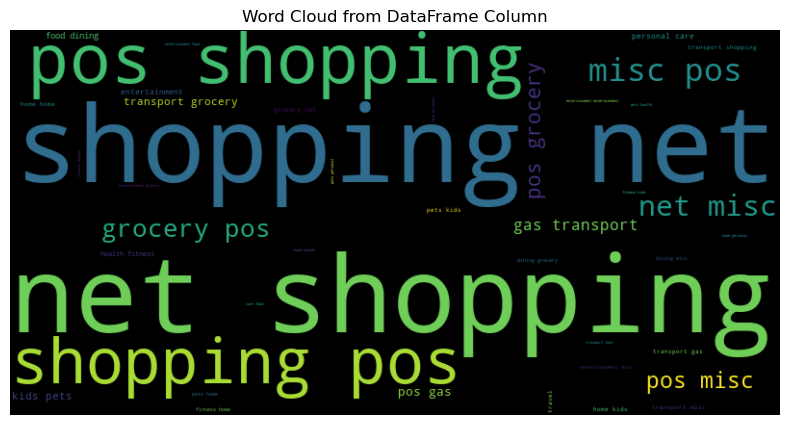

In [128]:
#creating the word cloud
text_data = text.str.cat(sep=' ')

wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text_data)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Word Cloud from DataFrame Column")
plt.show()

#### Visualization of the fraud data

Filter only rows with property_type as 'is_fraud' == 1

In [75]:
# Filter only rows with property_type as 'is_fraud' == 1
fraud_df = df[df['is_fraud'] == 1]
fraud_df.head()

,gender,state,zip,city_pop,category,amt,is_fraud,day,is_weekend,issuer,job_category,age_category,location,age,age_range,time_category
16331,m,ma,1803,24487,grocery pos,10.51,1,21,True,JCB,Tech,adults,urban,39,35-44,Morning
16332,m,ma,1803,24487,misc net,307.90,1,21,True,JCB,Tech,adults,urban,39,35-44,Morning
16333,m,ma,1803,24487,misc net,733.23,1,21,True,JCB,Tech,adults,urban,39,35-44,Night
16334,m,ma,1803,24487,gas transport,889.59,1,21,True,JCB,Tech,adults,urban,39,35-44,Night
16335,m,ma,1803,24487,misc net,741.87,1,22,True,JCB,Tech,adults,urban,39,35-44,Morning


In [87]:
fraud_df = fraud_df.drop(['zip', 'city_pop', 'amt', 'is_fraud', 'age'], axis=1)

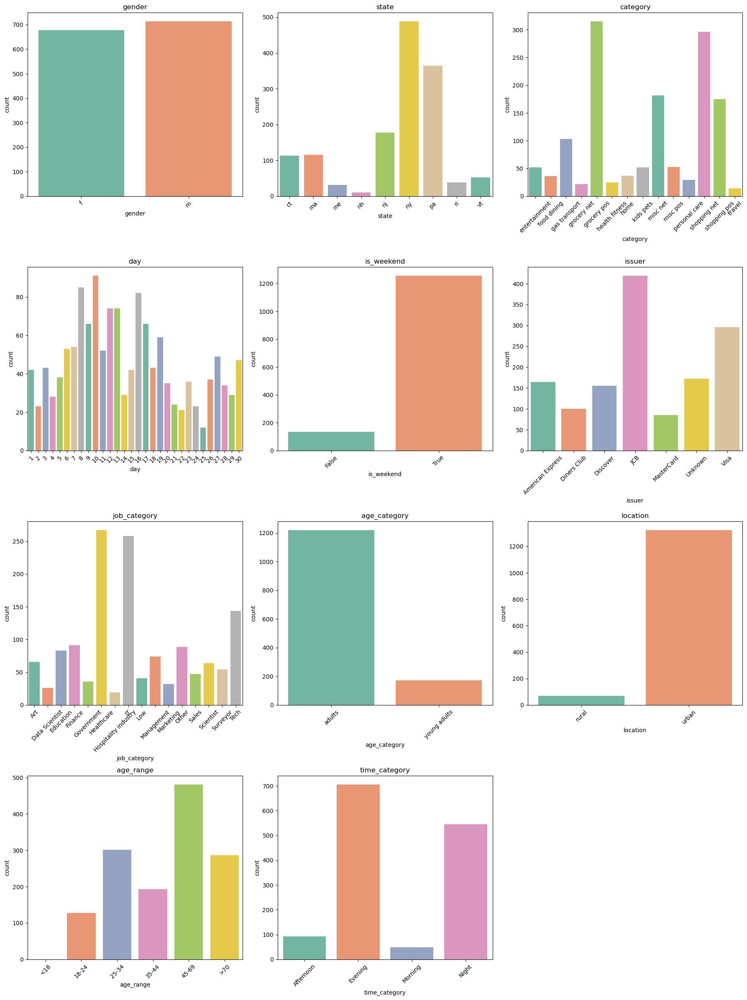

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the number of subplots
num_cols = len(fraud_df.columns)  
num_rows = (num_cols // 3) + (num_cols % 3 > 0)  # Arrange plots in rows of 3

plt.figure(figsize=(18, 6 * num_rows))  # Adjust figure size

for i, col in enumerate(fraud_df.columns, 1):  # Start index from 1 for subplot
    plt.subplot(num_rows, 3, i)  # Dynamic row and column adjustment
    sns.countplot(data=fraud_df, x=col, palette='Set2')
    plt.title(f'{col}')
    
    # Rotate y-axis labels by 45 degrees
    plt.xticks(rotation=45)

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


Agg of fraud by different groups

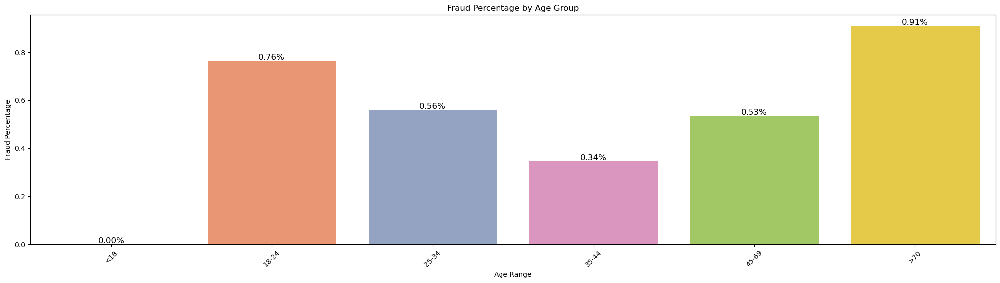

In [101]:
import matplotlib.pyplot as plt
import seaborn as sns

# Aggregate the age groups with fraud count
age_group_aggregation = df.groupby(['age_range', 'is_fraud']).size().reset_index(name='count')

# Calculate the total count per age_range
total_counts = age_group_aggregation.groupby('age_range')['count'].transform('sum')

# Calculate the percentage of fraud cases (is_fraud == 1)
age_group_aggregation['fraud_percentage'] = ((age_group_aggregation['count'] / total_counts) * 100)

# Filter only fraud cases (is_fraud == 1) for displaying fraud percentage
fraud_percentage_df = age_group_aggregation[age_group_aggregation['is_fraud'] == 1][['age_range', 'fraud_percentage']]

# Plot the fraud percentage per age group
plt.figure(figsize=(25, 6))
ax = sns.barplot(data=fraud_percentage_df, x='age_range', y='fraud_percentage', palette='Set2')

# Set labels and title
plt.xlabel('Age Range')
plt.ylabel('Fraud Percentage')
plt.title('Fraud Percentage by Age Group')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add percentage labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

# Show the plot
plt.show()



In [100]:
print(fraud_percentage_df)

   age_range  fraud_percentage
1        <18          0.000000
3      18-24          0.763860
5      25-34          0.558845
7      35-44          0.344551
9      45-69          0.534611
11       >70          0.908976


Fraud rates vary significantly by age, with the highest incidence in the >70 group and no fraud in the <18 group. Younger adults (18-24) also show elevated fraud rates, while the 35-44 group is the least affected among adults. This suggests that age is a relevant factor in fraud detection, with older and younger individuals potentially being more susceptible to fraud.

It can be seen that the percentage of the fraud is very low less then 1%

In [93]:
# Aggregate the age groups with fraud count
age_group_aggregation = df.groupby(['category', 'is_fraud']).size().reset_index(name='count')

# Calculate the total count per age_range
total_counts = age_group_aggregation.groupby('category')['count'].transform('sum')

# Calculate the percentage of fraud cases (is_fraud == 1)
age_group_aggregation['fraud_percentage'] = ((age_group_aggregation['count'] / total_counts) * 100)

# Filter only fraud cases (is_fraud == 1) for displaying fraud percentage
fraud_percentage_df = age_group_aggregation[age_group_aggregation['is_fraud'] == 1][['category', 'fraud_percentage']]

# Display result
print(fraud_percentage_df)

          category  fraud_percentage
1    entertainment        100.000000
3      food dining        100.000000
5    gas transport        100.000000
7      grocery net        100.000000
9      grocery pos        100.000000
11  health fitness        100.000000
13            home        100.000000
15       kids pets        100.000000
17        misc net        100.000000
19        misc pos          9.851301
21   personal care        100.000000
23    shopping net          0.228907
25    shopping pos          0.146976
27          travel        100.000000


The data suggests a strong association between certain transaction categories and fraud, with most categories showing exclusively fraudulent activity, while shopping-related categories (shopping net and shopping pos) and misc pos exhibit significantly lower fraud rates. This could guide fraud detection efforts by prioritizing monitoring of high-fraud categories, though further investigation into data quality and sample size is needed to confirm these patterns.

In [111]:
# Aggregate the age groups with fraud count
age_group_aggregation = df.groupby(['time_category', 'is_fraud']).size().reset_index(name='count')

# Calculate the total count per age_range
total_counts = age_group_aggregation.groupby('time_category')['count'].transform('sum')

# Calculate the percentage of fraud cases (is_fraud == 1)
age_group_aggregation['fraud_percentage'] = ((age_group_aggregation['count'] / total_counts) * 100)

# Filter only fraud cases (is_fraud == 1) for displaying fraud percentage
fraud_percentage_df = age_group_aggregation[age_group_aggregation['is_fraud'] == 1][['time_category', 'fraud_percentage']]

# Display result
print(fraud_percentage_df)

  time_category  fraud_percentage
1     Afternoon          0.111110
3       Evening          0.840146
5       Morning          0.119117
7         Night          1.299754


<Figure size 2500x600 with 0 Axes>

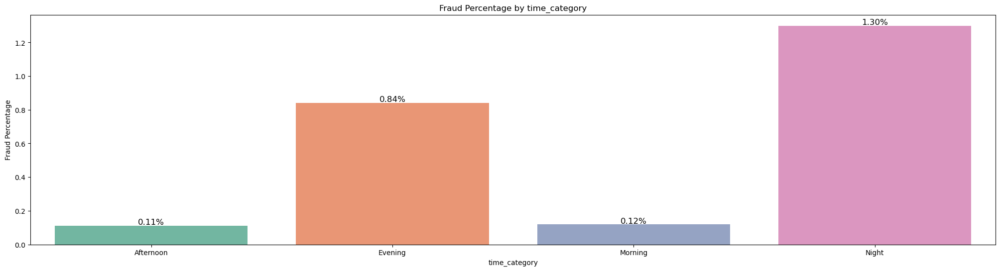

In [112]:
# Plot the fraud percentage per issuer
plt.figure(figsize=(25, 6))
ax = sns.barplot(data=fraud_percentage_df, x='time_category', y='fraud_percentage', palette='Set2')

# Set labels and title
plt.xlabel('time_category')
plt.ylabel('Fraud Percentage')
plt.title('Fraud Percentage by time_category')

# Add percentage labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

# Show the plot
plt.show()

Fraud rates are significantly higher during the Night and Evening, with Night being the peak time for fraudulent activity. In contrast, Morning and Afternoon show much lower fraud rates. This suggests that the time of day is a critical factor in fraud detection, with nighttime and evening hours being high-risk periods for fraudulent transactions.

In [105]:
# Aggregate the age groups with fraud count
age_group_aggregation = df.groupby(['issuer', 'is_fraud']).size().reset_index(name='count')

# Calculate the total count per age_range
total_counts = age_group_aggregation.groupby('issuer')['count'].transform('sum')

# Calculate the percentage of fraud cases (is_fraud == 1)
age_group_aggregation['fraud_percentage'] = ((age_group_aggregation['count'] / total_counts) * 100)

# Filter only fraud cases (is_fraud == 1) for displaying fraud percentage
fraud_percentage_df = age_group_aggregation[age_group_aggregation['is_fraud'] == 1][['issuer', 'fraud_percentage']]

# Display result
print(fraud_percentage_df)

              issuer  fraud_percentage
1   American Express          0.916099
3        Diners Club          0.500701
5           Discover          0.808808
7                JCB          0.703445
9         MasterCard          0.380211
11           Unknown          0.386187
13              Visa          0.446550


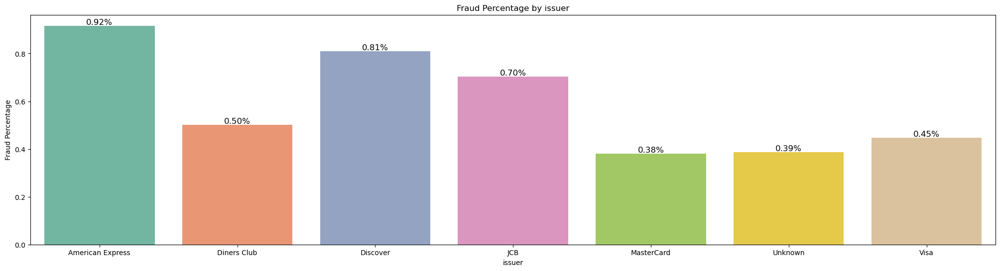

In [109]:
# Plot the fraud percentage per issuer
plt.figure(figsize=(25, 6))
ax = sns.barplot(data=fraud_percentage_df, x='issuer', y='fraud_percentage', palette='Set2')

# Set labels and title
plt.xlabel('issuer')
plt.ylabel('Fraud Percentage')
plt.title('Fraud Percentage by issuer')

# Add percentage labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

# Show the plot
plt.show()

Fraud rates vary significantly by issuer, with American Express and Discover showing the highest fraud percentages, while MasterCard, Unknown, and Visa have the lowest. This suggests that the issuer type may be a relevant factor in fraud detection, with certain issuers (American Express) being more associated with fraudulent transactions in this dataset.

### Feature Engineering

In [186]:
df['merchant'] = df['merchant'].str.replace('fraud', '')
df['merchant']

185         stanton  jakubowski and baumbach
186                             predovic inc
187                            heathcote llc
188                little  gutmann and lynch
189                       gleason macejkovic
                         ...                
1364531                            pagac llc
1364532                             kuhn llc
1364533                             kihn inc
1364534                     denesik and sons
1364535          haley  jewess and bechtelar
Name: merchant, Length: 249782, dtype: string

In [184]:
import pandas as pd

# Create a new column 'corporate_type' that adds "Inc", "LLC", "Ltd", "PLC", or "Group" if present in the 'merchant' column
df['corporate_type'] = df['merchant'].apply(lambda x: 'llc or inc' if 'inc' in x else 
                                            ('llc or inc' if 'llc' in x else 
                                             ('ltd' if 'ltd' in x else
                                              ('plc' if 'plc' in x else
                                               ('llc or inc' if 'and' in x else
                                               ('group' if 'group' in x else 'other'))))))

# Display the updated DataFrame with the counts of each type
print(df['corporate_type'].value_counts())


corporate_type
llc or inc    155036
other          57719
plc            17453
ltd            12118
group           7456
Name: count, dtype: int64


In [187]:
# Filter rows where 'corporate_type' is 'other' and display the 'merchant' column
other_merchants = df[df['corporate_type'] == 'other']['merchant']

# Display the 'merchant' values for the rows with 'corporate_type' == 'other'
other_merchants


189         gleason macejkovic
191           volkman predovic
194         gleason macejkovic
195                kozey boehm
198                 terry huel
                  ...         
1364520       macejkovic lesch
1364522          pouros conroy
1364524             metz boehm
1364529           kris padberg
1364530            beier hyatt
Name: merchant, Length: 57719, dtype: string

In [188]:
df = df.drop(['merchant'], axis=1)

In [189]:
df

,gender,state,zip,city_pop,acct_num,profile,category,amt,is_fraud,day,is_weekend,issuer,job_category,age_category,location,age,age_range,time_category,corporate_type
185,f,nj,7005,15269,826475243361,young adults female urban,shopping net,81.83,0,9,True,Visa,Scientist,young adults,urban,22,18-24,Evening,llc or inc
186,f,nj,7005,15269,826475243361,young adults female urban,shopping net,68.48,0,11,True,Visa,Scientist,young adults,urban,22,18-24,Evening,llc or inc
187,f,nj,7005,15269,826475243361,young adults female urban,shopping net,9.54,0,23,True,Visa,Scientist,young adults,urban,22,18-24,Afternoon,llc or inc
188,f,nj,7005,15269,826475243361,young adults female urban,shopping net,2.93,0,24,True,Visa,Scientist,young adults,urban,22,18-24,Evening,llc or inc
189,f,nj,7005,15269,826475243361,young adults female urban,shopping net,1.30,0,8,True,Visa,Scientist,young adults,urban,22,18-24,Afternoon,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1364531,m,ny,12414,10510,846920444376,adults 50up male urban,shopping pos,223.34,0,27,True,Discover,IT,adults,urban,57,45-69,Morning,llc or inc
1364532,m,ny,12414,10510,846920444376,adults 50up male urban,shopping pos,53.08,0,2,False,Discover,IT,adults,urban,57,45-69,Night,llc or inc
1364533,m,ny,12414,10510,846920444376,adults 50up male urban,shopping pos,121.28,0,30,True,Discover,IT,adults,urban,57,45-69,Night,llc or inc
1364534,m,ny,12414,10510,846920444376,adults 50up male urban,shopping pos,66.31,0,27,True,Discover,IT,adults,urban,57,45-69,Morning,llc or inc


In [190]:
# Count the occurrences of each 'acct_num'
count_acct_num = df['acct_num'].value_counts()

# Map the count of each 'acct_num' to a new column 'count_acct_num'
df['count_acct_num'] = df['acct_num'].map(count_acct_num)

# Display the updated DataFrame
print(df['count_acct_num'].value_counts())


count_acct_num
87    3741
85    3570
89    3471
91    3458
88    2904
      ... 
13      13
10      10
9        9
5        5
4        4
Name: count, Length: 198, dtype: int64


In [191]:
df = df.drop(['acct_num'], axis=1)

In [192]:
# Count the occurrences of each 'acct_num'
count_acct_num = df['zip'].value_counts()

# Map the count of each 'acct_num' to a new column 'count_acct_num'
df['count_zip'] = df['zip'].map(count_acct_num)

# Display the updated DataFrame
print(df['count_zip'].value_counts())

count_zip
171    2394
263    2367
409    2045
354    1770
157    1727
       ... 
10       10
9         9
8         8
7         7
4         4
Name: count, Length: 394, dtype: int64


In [195]:
df = df.drop(['zip'], axis=1)

In [196]:
df

,gender,state,city_pop,profile,category,amt,is_fraud,day,is_weekend,issuer,job_category,age_category,location,age,age_range,time_category,corporate_type,count_acct_num,count_zip
185,f,nj,15269,young adults female urban,shopping net,81.83,0,9,True,Visa,Scientist,young adults,urban,22,18-24,Evening,llc or inc,68,180
186,f,nj,15269,young adults female urban,shopping net,68.48,0,11,True,Visa,Scientist,young adults,urban,22,18-24,Evening,llc or inc,68,180
187,f,nj,15269,young adults female urban,shopping net,9.54,0,23,True,Visa,Scientist,young adults,urban,22,18-24,Afternoon,llc or inc,68,180
188,f,nj,15269,young adults female urban,shopping net,2.93,0,24,True,Visa,Scientist,young adults,urban,22,18-24,Evening,llc or inc,68,180
189,f,nj,15269,young adults female urban,shopping net,1.30,0,8,True,Visa,Scientist,young adults,urban,22,18-24,Afternoon,other,68,180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1364531,m,ny,10510,adults 50up male urban,shopping pos,223.34,0,27,True,Discover,IT,adults,urban,57,45-69,Morning,llc or inc,59,59
1364532,m,ny,10510,adults 50up male urban,shopping pos,53.08,0,2,False,Discover,IT,adults,urban,57,45-69,Night,llc or inc,59,59
1364533,m,ny,10510,adults 50up male urban,shopping pos,121.28,0,30,True,Discover,IT,adults,urban,57,45-69,Night,llc or inc,59,59
1364534,m,ny,10510,adults 50up male urban,shopping pos,66.31,0,27,True,Discover,IT,adults,urban,57,45-69,Morning,llc or inc,59,59


Log transfor, to the city pop column

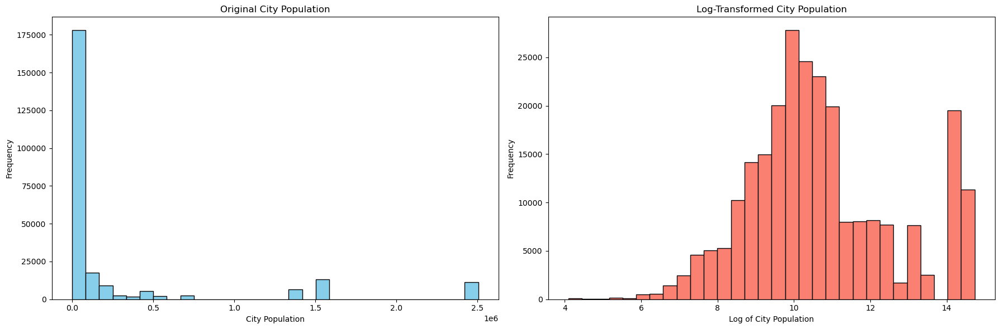

In [197]:
import numpy as np
import matplotlib.pyplot as plt

# Apply the log transformation (assuming city_pop is in the DataFrame 'df')
df['city_pop_log'] = np.log(df['city_pop'])

# Plot the original and transformed data
plt.figure(figsize=(18, 6))

# Plot the original city population
plt.subplot(1, 2, 1)
plt.hist(df['city_pop'], bins=30, color='skyblue', edgecolor='black')
plt.title('Original City Population')
plt.xlabel('City Population')
plt.ylabel('Frequency')

# Plot the log-transformed city population
plt.subplot(1, 2, 2)
plt.hist(df['city_pop_log'], bins=30, color='salmon', edgecolor='black')
plt.title('Log-Transformed City Population')
plt.xlabel('Log of City Population')
plt.ylabel('Frequency')

# Display the plots
plt.tight_layout()
plt.show()


The log transformation of city population data significantly improves the distribution for analysis. The original data is heavily right-skewed, with most transactions occurring in cities with very small populations, making it challenging to identify patterns or relationships. After applying the logarithmic transformation, the distribution becomes more symmetric and closer to a normal distribution, which is more suitable for statistical analysis, such as the t-test performed in the previous fraud distribution analysis.

In [198]:
df = df.drop(['city_pop'], axis=1)

Log transfor, to the amt column

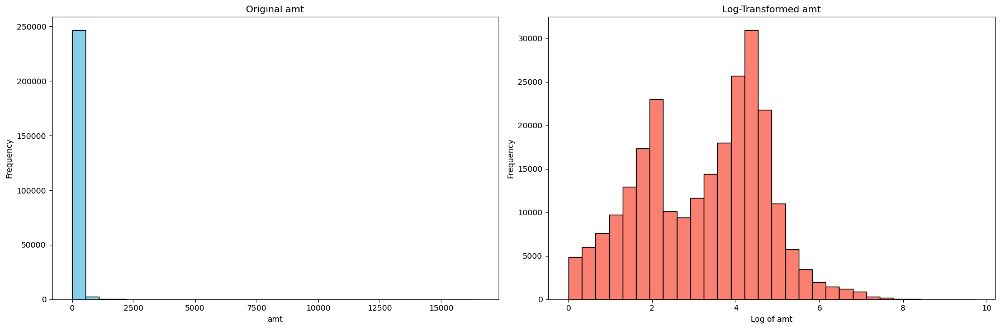

In [204]:
# Apply the log transformation (assuming city_pop is in the DataFrame 'df')
df['amt_log'] = np.log(df['amt'])

# Plot the original and transformed data
plt.figure(figsize=(18, 6))

# Plot the original city population
plt.subplot(1, 2, 1)
plt.hist(df['amt'], bins=30, color='skyblue', edgecolor='black')
plt.title('Original amt')
plt.xlabel('amt')
plt.ylabel('Frequency')

# Plot the log-transformed city population
plt.subplot(1, 2, 2)
plt.hist(df['amt_log'], bins=30, color='salmon', edgecolor='black')
plt.title('Log-Transformed amt')
plt.xlabel('Log of amt')
plt.ylabel('Frequency')

# Display the plots
plt.tight_layout()
plt.show()

The logarithmic transformation of transaction amounts significantly improves the distribution for analysis. The original data (amt) is heavily right-skewed, with most transactions being very small, which obscures patterns and makes statistical analysis challenging. After applying the logarithmic transformation (log of amt), the distribution becomes more symmetric and closer to a normal distribution, which is more suitable for statistical methods like t-tests or regression analysis often used in fraud detection.

In [205]:
df = df.drop(['amt'], axis=1)

# Stage - Feature Selection

Choosing the most effective variables

In [199]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [201]:
df = df.drop(['age_range'], axis=1)

In [207]:
df = df.drop(['profile'], axis=1)

In [210]:
import pickle

with open('df_feature_engineering.pkl', 'wb') as f:
    pickle.dump(df, f)

print("fruad feature engineering saved as a pickle file.")

fruad feature engineering saved as a pickle file.


In [211]:
df_copy = df.copy()

In [213]:
df = pd.get_dummies(df, columns=['issuer', 'category', 'time_category', 'corporate_type'], drop_first=True)

,gender,state,is_fraud,day,is_weekend,job_category,age_category,location,age,count_acct_num,...,category_shopping net,category_shopping pos,category_travel,time_category_Evening,time_category_Morning,time_category_Night,corporate_type_llc or inc,corporate_type_ltd,corporate_type_other,corporate_type_plc
185,f,nj,0,9,True,Scientist,young adults,urban,22,68,...,True,False,False,True,False,False,True,False,False,False
186,f,nj,0,11,True,Scientist,young adults,urban,22,68,...,True,False,False,True,False,False,True,False,False,False
187,f,nj,0,23,True,Scientist,young adults,urban,22,68,...,True,False,False,False,False,False,True,False,False,False
188,f,nj,0,24,True,Scientist,young adults,urban,22,68,...,True,False,False,True,False,False,True,False,False,False
189,f,nj,0,8,True,Scientist,young adults,urban,22,68,...,True,False,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1364531,m,ny,0,27,True,IT,adults,urban,57,59,...,False,True,False,False,True,False,True,False,False,False
1364532,m,ny,0,2,False,IT,adults,urban,57,59,...,False,True,False,False,False,True,True,False,False,False
1364533,m,ny,0,30,True,IT,adults,urban,57,59,...,False,True,False,False,False,True,True,False,False,False
1364534,m,ny,0,27,True,IT,adults,urban,57,59,...,False,True,False,False,True,False,True,False,False,False


In [214]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
df['gender'] = encoder.fit_transform(df['gender'])
df['state'] = encoder.fit_transform(df['state'])
df['is_weekend'] = encoder.fit_transform(df['is_weekend'])
df['job_category'] = encoder.fit_transform(df['job_category'])
df['age_category'] = encoder.fit_transform(df['age_category'])
df['location'] = encoder.fit_transform(df['location'])

In [219]:
df['day'] = encoder.fit_transform(df['day'])

In [220]:
df

,gender,state,is_fraud,day,is_weekend,job_category,age_category,location,age,count_acct_num,...,category_shopping net,category_shopping pos,category_travel,time_category_Evening,time_category_Morning,time_category_Night,corporate_type_llc or inc,corporate_type_ltd,corporate_type_other,corporate_type_plc
185,0,4,0,8,1,13,1,1,22,68,...,True,False,False,True,False,False,True,False,False,False
186,0,4,0,10,1,13,1,1,22,68,...,True,False,False,True,False,False,True,False,False,False
187,0,4,0,22,1,13,1,1,22,68,...,True,False,False,False,False,False,True,False,False,False
188,0,4,0,23,1,13,1,1,22,68,...,True,False,False,True,False,False,True,False,False,False
189,0,4,0,7,1,13,1,1,22,68,...,True,False,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1364531,1,5,0,26,1,7,0,1,57,59,...,False,True,False,False,True,False,True,False,False,False
1364532,1,5,0,1,0,7,0,1,57,59,...,False,True,False,False,False,True,True,False,False,False
1364533,1,5,0,29,1,7,0,1,57,59,...,False,True,False,False,False,True,True,False,False,False
1364534,1,5,0,26,1,7,0,1,57,59,...,False,True,False,False,True,False,True,False,False,False


In [221]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 249782 entries, 185 to 1364535
Data columns (total 39 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   gender                     249782 non-null  int32  
 1   state                      249782 non-null  int32  
 2   is_fraud                   249782 non-null  int64  
 3   day                        249782 non-null  int64  
 4   is_weekend                 249782 non-null  int64  
 5   job_category               249782 non-null  int32  
 6   age_category               249782 non-null  int32  
 7   location                   249782 non-null  int32  
 8   age                        249782 non-null  int64  
 9   count_acct_num             249782 non-null  int64  
 10  count_zip                  249782 non-null  int64  
 11  city_pop_log               249782 non-null  float64
 12  amt_log                    249782 non-null  float64
 13  issuer_Diners Club         2497

In [217]:
y=df['is_fraud']
X = df.drop(columns=['is_fraud'])

# Hyperparameters

## Multivariable Analysis

In [222]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel
from sklearn.svm import LinearSVC
from sklearn.linear_model import Ridge

### Summarization and Selection of Variables 

The Lasso penalty here is controlled by alpha = 0.01. This penalty forces some coefficients to shrink to zero, effectively performing feature selection. A higher penalty (larger alpha) would result in more coefficients being zeroed out, and a lower penalty (smaller alpha) would retain more features.

In [223]:
# Fit models and determine if a feature is selected (1) or not (0)
lasso = Lasso(alpha=0.01).fit(X, y)
lasso_selected = (np.abs(lasso.coef_) > 0).astype(int)

# Fit Ridge model
ridge = Ridge(alpha=0.01).fit(X, y)
ridge_selected = (np.abs(ridge.coef_) > 0).astype(int)

svm = LinearSVC(C=0.01, penalty="l1", dual=False).fit(X, y)
svm_selected = (np.abs(svm.coef_[0]) > 0).astype(int)

gb = GradientBoostingClassifier().fit(X, y)
gb_selected = (gb.feature_importances_ > 0).astype(int)

rf = RandomForestClassifier().fit(X, y)
rf_selected = (rf.feature_importances_ > 0).astype(int)

# Create a DataFrame to store results
selection_df = pd.DataFrame({
    'Feature': X.columns,
    'Lasso': lasso_selected, 
    'SVM': svm_selected,
    'GradientBoost': gb_selected,
    'RandomForest': rf_selected,
    'Ridge': ridge_selected
})

# Sum the number of selections for each feature
selection_df['Sum'] = selection_df[['Lasso', 'SVM', 'GradientBoost', 'RandomForest','Ridge']].sum(axis=1)

# Output the results
print(selection_df)

                      Feature  Lasso  SVM  GradientBoost  RandomForest  Ridge  \
0                      gender      0    0              1             1      1   
1                       state      0    1              1             1      1   
2                         day      0    1              1             1      1   
3                  is_weekend      0    0              0             1      1   
4                job_category      0    1              1             1      1   
5                age_category      0    1              1             1      1   
6                    location      0    1              1             1      1   
7                         age      1    1              1             1      1   
8              count_acct_num      1    1              1             1      1   
9                   count_zip      1    1              1             1      1   
10               city_pop_log      0    1              1             1      1   
11                    amt_lo

# Creating DataFrame with most valuable variables 

 Selected variables - recommended by 3 or more models 

In [227]:
 #Selecting variables with a sum of selections >= 4
final_var = selection_df[selection_df['Sum'] >= 4]['Feature'].tolist()
df_model = df[final_var].copy()
df_model['is_fraud'] = df['is_fraud'].copy()

# Output the result to verify
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 249782 entries, 185 to 1364535
Data columns (total 17 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   state                   249782 non-null  int32  
 1   day                     249782 non-null  int64  
 2   job_category            249782 non-null  int32  
 3   age_category            249782 non-null  int32  
 4   location                249782 non-null  int32  
 5   age                     249782 non-null  int64  
 6   count_acct_num          249782 non-null  int64  
 7   count_zip               249782 non-null  int64  
 8   city_pop_log            249782 non-null  float64
 9   amt_log                 249782 non-null  float64
 10  category_gas transport  249782 non-null  bool   
 11  category_grocery pos    249782 non-null  bool   
 12  category_shopping net   249782 non-null  bool   
 13  category_shopping pos   249782 non-null  bool   
 14  time_category_Evening 

In [228]:
df = df_model.copy()

In [233]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 249782 entries, 185 to 1364535
Data columns (total 17 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   state                   249782 non-null  int32  
 1   day                     249782 non-null  int64  
 2   job_category            249782 non-null  int32  
 3   age_category            249782 non-null  int32  
 4   location                249782 non-null  int32  
 5   age                     249782 non-null  int64  
 6   count_acct_num          249782 non-null  int64  
 7   count_zip               249782 non-null  int64  
 8   city_pop_log            249782 non-null  float64
 9   amt_log                 249782 non-null  float64
 10  category_gas transport  249782 non-null  bool   
 11  category_grocery pos    249782 non-null  bool   
 12  category_shopping net   249782 non-null  bool   
 13  category_shopping pos   249782 non-null  bool   
 14  time_category_Evening 

### One-Hot Encoding 

Or labael encoding<br>
Encoding Categorial Data<br>
#get_dummies<br>
#LabelEncoder

In [229]:
from sklearn.preprocessing import LabelEncoder
label_encoders = {}
for column in []:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

In [232]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 249782 entries, 185 to 1364535
Data columns (total 17 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   state                   249782 non-null  int32  
 1   day                     249782 non-null  int64  
 2   job_category            249782 non-null  int32  
 3   age_category            249782 non-null  int32  
 4   location                249782 non-null  int32  
 5   age                     249782 non-null  int64  
 6   count_acct_num          249782 non-null  int64  
 7   count_zip               249782 non-null  int64  
 8   city_pop_log            249782 non-null  float64
 9   amt_log                 249782 non-null  float64
 10  category_gas transport  249782 non-null  bool   
 11  category_grocery pos    249782 non-null  bool   
 12  category_shopping net   249782 non-null  bool   
 13  category_shopping pos   249782 non-null  bool   
 14  time_category_Evening 

In [234]:
with open('df_feature_selection.pkl', 'wb') as f:
    pickle.dump(df_model, f)

print("fruad feature selection saved as a pickle file.")

fruad feature selection saved as a pickle file.


In [236]:
sb.pairplot(pd.concat([df.iloc[:, :6], df['is_fraud']], axis=1 ), hue='is_fraud')
plt.show()

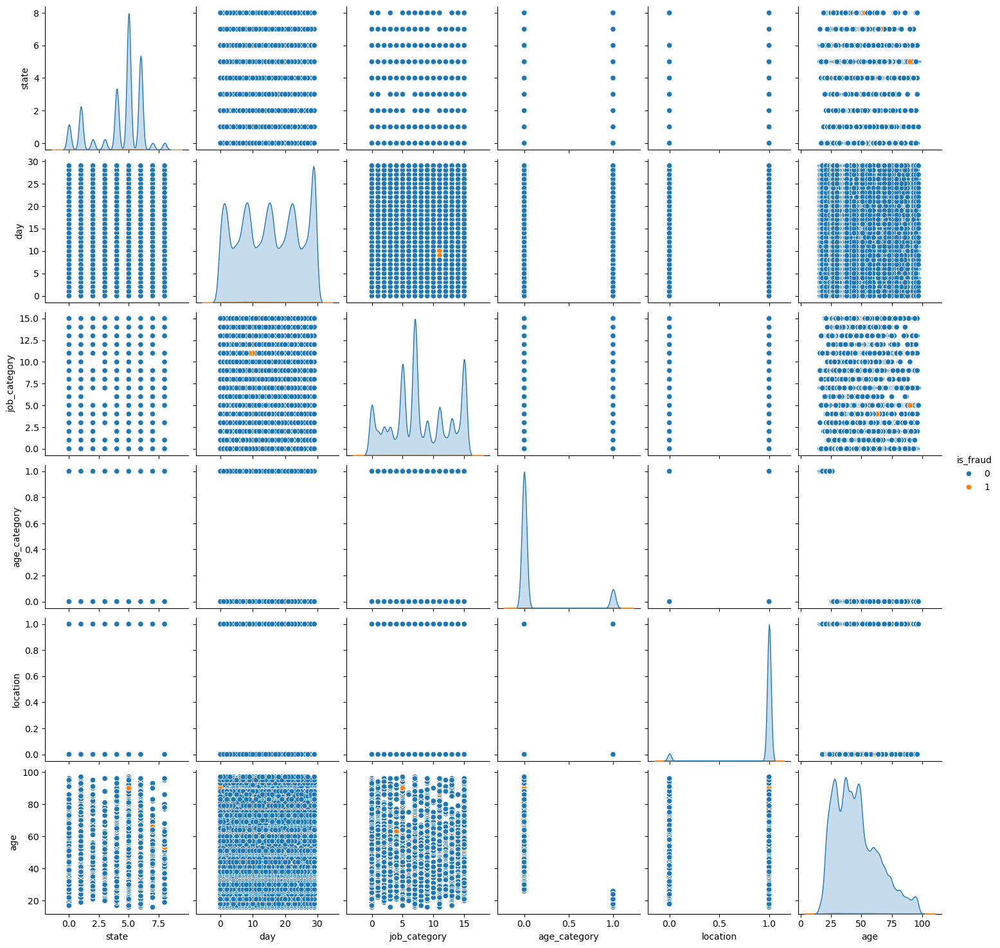

In [237]:
plt.show()